### Bonus. Improving a Local Search

You are trying to fly an airplane to pass through $N = 100$ checkpoints on a coordinate plane. Your route is defined as a list with the integers $1, 2, \ldots, N$, where each checkpoint appears exactly once.

During the flight, the plane will change its direction at most $N - 2$ times. If the angle of the polygonal line at a checkpoint is small, the change of the direction of the airplane at that checkpoint is large, and there is a risk of failure of the flight. Therefore, you would like to make the **minimum** angle of the polygonal line at the $N - 2$ checkpoints, except for the starting checkpoint and the last checkpoint, **as large as possible**.

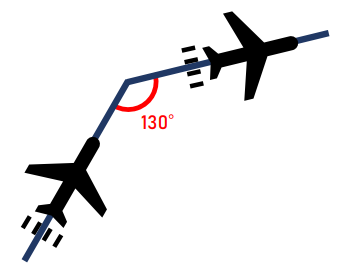 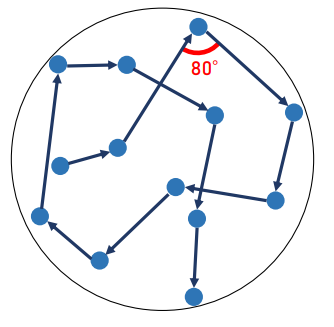

You decided to use hill climbing to solve this problem. However, the performance is not so good... you only attained a minimum angle of $\approx 20^{\circ}$ (which is dangerous!).

**Your task**: Come up with ways to improve the performance of the local search. Implement your approach and achieve a minimum angle of $\geq 50^{\circ}$ **within 1 minute**. (This is very realistic - I have a solution with minimum angle $\geq 120^{\circ}$.) Note that you are free to edit the function `hill_climbing` and/or add new functions.

**Submission:** Send me an explanation of your approach and relevant screenshots before / during the tutorial (for bonus EXP)!

In [1]:
import time
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
plt.rcParams["animation.embed_limit"] = 100.0

In [2]:
np.random.seed(2109)

n = 100
points = np.random.randint(0, 100, size=(n, 2))


def get_angle(a, b, c):
    ba = a - b
    bc = c - b
    dot = np.dot(ba, bc)
    norm_ba = np.dot(ba, ba)
    norm_bc = np.dot(bc, bc)
    if norm_ba == 0 or norm_bc == 0:
        return 180.0
    cos_theta = dot / np.sqrt(norm_ba * norm_bc)
    cos_theta = np.clip(cos_theta, -1.0, 1.0)
    angle_rad = np.arccos(cos_theta)
    return np.degrees(angle_rad)


def get_min_angle(perm):
    route = points[perm]
    min_angle = 180.0
    for i in range(1, n - 1):
        a, b, c = route[i - 1], route[i], route[i + 1]
        angle = get_angle(a, b, c)
        min_angle = min(min_angle, angle)
    return min_angle


def plot_graph_init():
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_title("Hill Climbing Optimization of Route")
    ax.axis("equal")
    ax.grid(True)

    xmin, xmax = points[:, 0].min(), points[:, 0].max()
    ymin, ymax = points[:, 1].min(), points[:, 1].max()
    pad_x = (xmax - xmin) * 0.05 + 1
    pad_y = (ymax - ymin) * 0.05 + 1
    ax.set_xlim(xmin - pad_x, xmax + pad_x)
    ax.set_ylim(ymin - pad_y, ymax + pad_y)

    scat = ax.scatter(points[:, 0], points[:, 1], color='blue', s=40, alpha=0.8)
    arrows = ax.quiver(
        np.zeros(n-1), np.zeros(n-1),
        np.zeros(n-1), np.zeros(n-1),
        angles='xy', scale_units='xy', scale=1,
        color='black', width=0.004, alpha=0.8
    )
    text = ax.text(0.02, 0.95, "", transform=ax.transAxes, fontsize=12, va="top")

    return fig, ax, scat, arrows, text


def update_plot(frame_data, line, text):
    perm, value = frame_data
    route = points[perm]
    dx = route[1:, 0] - route[:-1, 0]
    dy = route[1:, 1] - route[:-1, 1]
    arrows.set_offsets(route[:-1])
    arrows.set_UVC(dx, dy)
    text.set_text(f"Min Angle: {value:.2f}°")
    # return a tuple/list of artists that changed
    return arrows, text


In [3]:
perm = np.random.permutation(n)
fig, ax, scat, arrows, text = plot_graph_init()
ani = FuncAnimation(fig, update_plot, frames=[(perm, get_min_angle(perm))], fargs=(arrows, text),
                    interval=250, blit=True, repeat=False)
plt.close(fig)

HTML(ani.to_jshtml())

In [4]:
# TODO: Edit this cell to improve the performance of the local search.
def hill_climbing(init_perm, max_iter=100, n_neighbours=100):    
    current_perm = init_perm.copy()
    current_value = get_min_angle(current_perm)
    yield current_perm, current_value

    for step in range(max_iter):
        improved = False
        best_local_perm = None
        best_local_value = current_value

        for _ in range(n_neighbours):
            i, j = np.random.randint(0, n, size=2)
            if i == j:
                continue
            new_perm = current_perm.copy()
            new_perm[i], new_perm[j] = new_perm[j], new_perm[i]
            new_value = get_min_angle(new_perm)

            if new_value > best_local_value:
                best_local_value = new_value
                best_local_perm = new_perm
                improved = True

        if improved:
            current_perm = best_local_perm
            current_value = best_local_value
            yield current_perm, current_value

        if step % 10 == 9:
            print(f"Step {step}, Current Value: {current_value}")

        if not improved:
            break


In [5]:
%%time
np.random.seed(2109)
init_perm = np.random.permutation(n)
fig, ax, scat, arrows, text = plot_graph_init()
gen = hill_climbing(init_perm)
ani = FuncAnimation(fig, update_plot, frames=gen, fargs=(arrows, text),
                    interval=250, blit=True, repeat=False, cache_frame_data=False)
plt.close(fig)
HTML(ani.to_jshtml())

Step 9, Current Value: 12.34878947424126
Step 19, Current Value: 20.785798182446726
Wall time: 11.5 s
